Base de Dados: Eleições Brasileiras
Dados de eleições brasileiras desde 1945 fornecidos pelo TSE. Inclui dados de eleitorado, candidaturas, resultados e prestação de contas

Dor: Como prever quais zonas/seções eleitorais apresentarão maior demanda de eleitores em uma próxima eleição para apoiar o planejamento e a distribuição de recursos eleitorais?


# 1. Carregamento e Visão Geral dos Dados



---
Import e verificação do head



In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import plotly.express as px
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
df = pd.read_csv('/content/drive/MyDrive/ Sistemas Inteligentes Orientados a Dados/br_tse_eleicoes_detalhes_votacao_municipio_zona.csv')

In [ ]:
df.head()

,ano,turno,id_eleicao,tipo_eleicao,data_eleicao,sigla_uf,id_municipio,id_municipio_tse,zona,cargo,...,abstencoes,votos_validos,votos_brancos,votos_nulos,votos_nominais,votos_legenda,proporcao_comparecimento,proporcao_votos_validos,proporcao_votos_brancos,proporcao_votos_nulos
0,1996,1,1996001,eleicao ordinaria,1996-10-03,AC,1200179.0,1015,1,vereador,...,588,1452,130,64,1434,18,73.679499,88.213852,7.897934,3.888214
1,1996,1,1996001,eleicao ordinaria,1996-10-03,AC,1200179.0,1015,1,prefeito,...,588,1565,17,64,1565,0,73.679499,95.078979,1.032807,3.888214
2,1996,1,1996001,eleicao ordinaria,1996-10-03,AC,1200138.0,1007,1,prefeito,...,852,2718,123,186,2718,0,78.035576,89.791873,4.063429,6.144698
3,1996,1,1996001,eleicao ordinaria,1996-10-03,AC,1200138.0,1007,1,vereador,...,852,2628,259,140,2601,27,78.035576,86.818632,8.556326,4.625041
4,1996,1,1996001,eleicao ordinaria,1996-10-03,AC,1200807.0,1023,1,prefeito,...,1539,4140,135,261,4140,0,74.666667,91.269841,2.976190,5.753968


# 2. Análise Exploratória e Pré-processamento

## 2.1 Visão Geral e Qualidade dos Dados

---
Análise dos Dados





In [ ]:
df.shape

(375714, 26)

In [ ]:
df.count()

,0
ano,375714
turno,375714
id_eleicao,375714
tipo_eleicao,375714
data_eleicao,375714
sigla_uf,375714
id_municipio,373904
id_municipio_tse,375714
zona,375714
cargo,375714


In [ ]:
df.dtypes

,0
ano,int64
turno,int64
id_eleicao,int64
tipo_eleicao,object
data_eleicao,object
sigla_uf,object
id_municipio,float64
id_municipio_tse,int64
zona,int64
cargo,object


In [ ]:
df.isnull().sum()


#As colunas: proporcao_votos_validos , proporcao_votos_brancos ,proporcao_votos_nulos Não são necessárias para o problema central


,0
ano,0
turno,0
id_eleicao,0
tipo_eleicao,0
data_eleicao,0
sigla_uf,0
id_municipio,1810
id_municipio_tse,0
zona,0
cargo,0


In [ ]:
df.duplicated().sum()

np.int64(0)

In [ ]:
for col in columns_for_boxplot:
    fig = px.box(df, y=col, title=f'Boxplot de {col} (Plotly Express)')
    fig.show()

In [ ]:
#ver maiores abstenções

Q1 = df_modelo['abstencoes'].quantile(0.25)
Q3 = df_modelo['abstencoes'].quantile(0.75)
IQR = Q3 - Q1

limite_outlier = Q3 + 1.5 * IQR

outliers_abstencoes = (
    df_modelo[df_modelo['abstencoes'] > limite_outlier]
    .sort_values('abstencoes', ascending=False)
)

print(f"Q1: {Q1:,.0f}")
print(f"Q3: {Q3:,.0f}")
print(f"IQR: {IQR:,.0f}")
print(f"Limite superior de outlier: {limite_outlier:,.0f}")
print(f"\nTotal de outliers: {len(outliers_abstencoes):,}")

# Mostrar os 30 maiores
outliers_abstencoes[
    [
        'ano',
        'sigla_uf',
        'zona',
        'cargo',
        'aptos',
        'comparecimento',
        'abstencoes',
        'proporcao_comparecimento'
    ]
].head(30)
#coerente

Q1: 766
Q3: 4,905
IQR: 4,139
Limite superior de outlier: 11,114

Total de outliers: 38,355


,ano,sigla_uf,zona,cargo,aptos,comparecimento,abstencoes,proporcao_comparecimento
48591,2024,SP,372,prefeito,245696,169917,75779,69.157414
149401,2020,SP,372,prefeito,267693,193171,74522,72.161394
4419,2020,SP,374,prefeito,239916,166422,73494,69.366778
2522,2020,SP,376,prefeito,239789,167753,72036,69.958589
2477,2020,SP,375,prefeito,245815,174150,71665,70.845961
149403,2020,SP,372,prefeito,267693,197302,70391,73.704579
149404,2020,SP,372,vereador,267693,197302,70391,73.704579
4418,2020,SP,374,prefeito,239916,170141,69775,70.916904
4416,2020,SP,374,vereador,239916,170141,69775,70.916904
11840,2024,SP,374,prefeito,213476,144377,69099,67.631490


In [ ]:
#Validação da estabilidade dos dados

print("Comparecimento > Aptos:")
print((df['comparecimento'] > df['aptos']).sum())

print("\nAbstenções > Aptos:")
print((df['abstencoes'] > df['aptos']).sum())

print("\nAbstenções negativas:")
print((df['abstencoes'] < 0).sum())

print("\nVotos válidos > Comparecimento:")
print((df['votos_validos'] > df['comparecimento']).sum())

print("\nAptos != Comparecimento + Abstenções:")
print(
    (
        df['aptos'] !=
        df['comparecimento'] + df['abstencoes']
    ).sum()
)


Comparecimento > Aptos:
0

Abstenções > Aptos:
0

Abstenções negativas:
0

Votos válidos > Comparecimento:
21147

Aptos != Comparecimento + Abstenções:
388


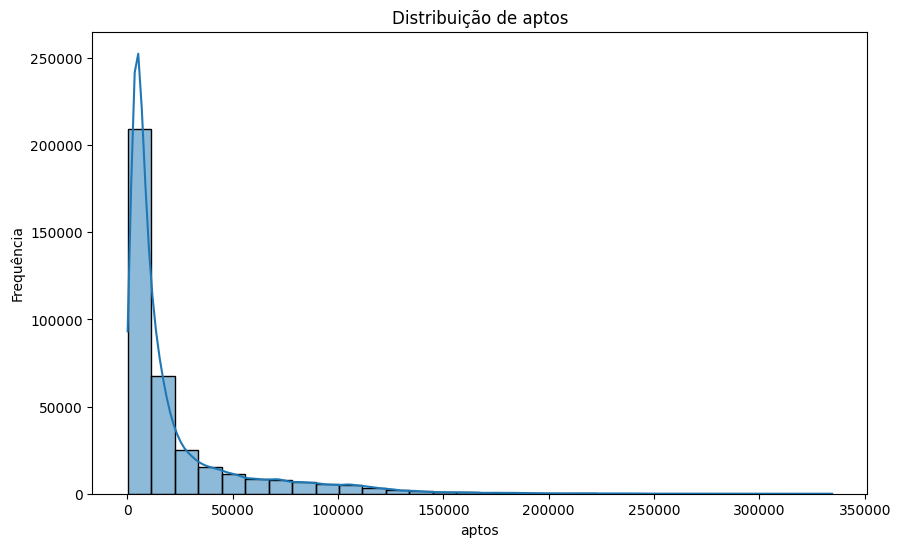

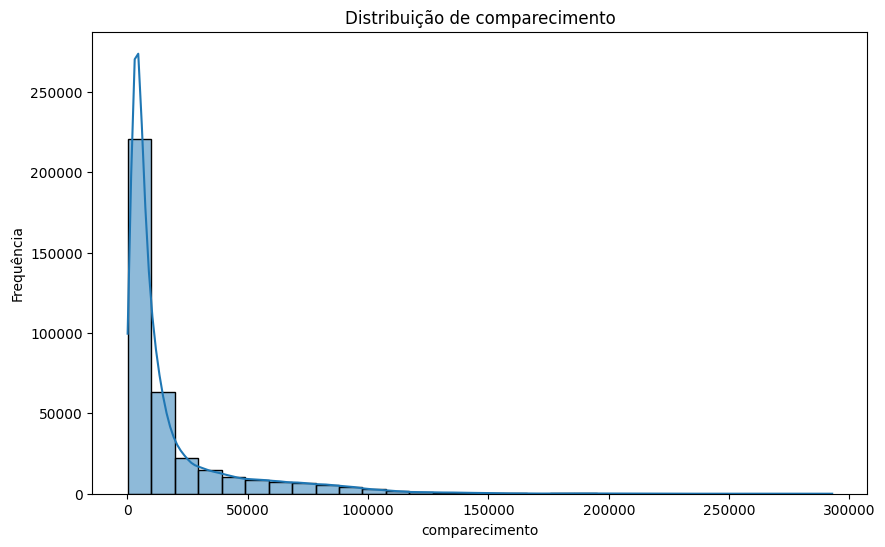

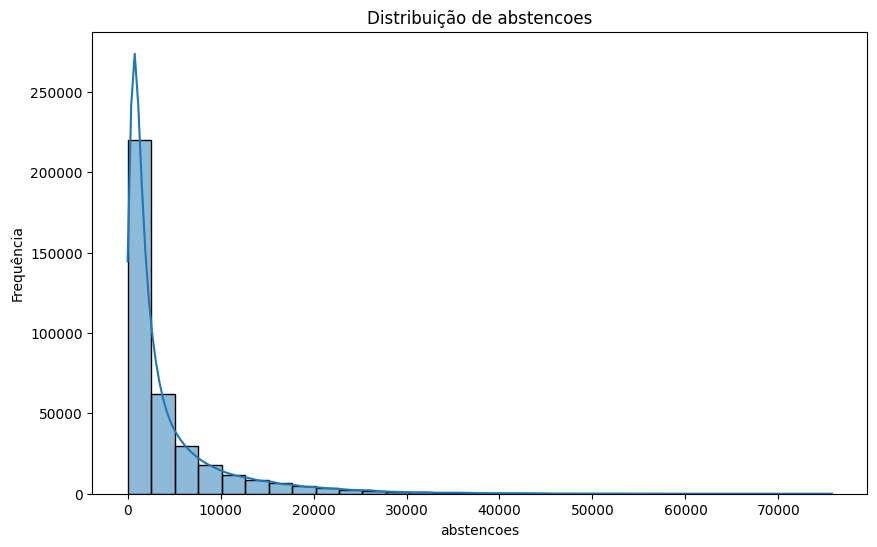

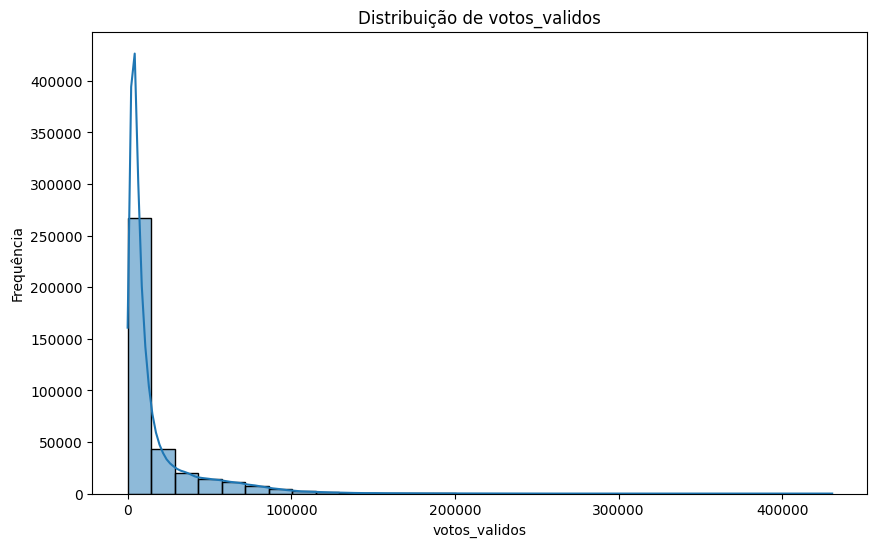

In [ ]:
columns_for_distribution = [
    'aptos',
    'comparecimento',
    'abstencoes',
    'votos_validos'
]

for col in columns_for_distribution:
    plt.figure(figsize=(10, 6))
    sns.histplot(df_modelo[col], kde=True, bins=30) # Using 30 bins as a default
    plt.title(f'Distribuição de {col}')
    plt.xlabel(col)
    plt.ylabel('Frequência')
    plt.show()

Foi identificado, entretanto, um conjunto de registros em que votos válidos são superiores ao número de comparecimentos. Essa ocorrência não foi considerada, isoladamente, como erro nos dados, pois a interpretação depende do cargo eleitoral. Em especial, eleições para o Senado podem apresentar mais de um voto por eleitor, fazendo com que o número de votos contabilizados para o cargo seja superior ao número de eleitores que compareceram.


In [ ]:
df[
    [
        'aptos',
        'comparecimento',
        'abstencoes',
        'votos_validos',
        'proporcao_comparecimento'
    ]
].describe()

,aptos,comparecimento,abstencoes,votos_validos,proporcao_comparecimento
count,375714.000000,375714.000000,375714.000000,375714.000000,375714.000000
mean,21953.624624,17758.682192,4194.644339,16291.899793,80.673104
std,31179.595639,25574.216053,6013.991685,23853.281721,7.796130
min,1.000000,0.000000,0.000000,0.000000,0.000000
25%,4447.000000,3600.000000,759.000000,3271.000000,76.570010
50%,9186.000000,7273.000000,1832.000000,6631.000000,81.420345
75%,23016.000000,18143.000000,4889.000000,16787.000000,85.656109
max,334557.000000,292845.000000,75779.000000,430553.000000,99.369266


In [ ]:
colunas = [
    'aptos',
    'comparecimento',
    'abstencoes',
    'votos_validos',
    'proporcao_comparecimento'
]

for coluna in colunas:
    zeros = df[coluna].eq(0)

    print(f"\n{'='*50}")
    print(f"{coluna}")
    print(f"{'='*50}")
    print(f"Zeros: {zeros.sum():,} ({zeros.mean()*100:.2f}%)")

    if zeros.sum() > 0:
        print("\nExemplos:")
        print(
            df.loc[
                zeros,
                ['ano', 'tipo_eleicao', 'sigla_uf', 'zona', 'cargo', coluna]
            ].head(5)
        )


aptos
Zeros: 0 (0.00%)

comparecimento
Zeros: 284 (0.08%)

Exemplos:
        ano                           tipo_eleicao sigla_uf  zona       cargo  \
16932  2016     eleicao suplementar rolim de moura       RO    29    prefeito   
16933  2016  eleicao suplementar ibitiura de minas       MG    13    prefeito   
16934  2016             suplementar de sandovalina       SP   261    prefeito   
16935  2016   suplementar santa cruz das palmeiras       SP    39    prefeito   
50714  2014                      eleicao ordinaria       ZZ     1  presidente   

       comparecimento  
16932               0  
16933               0  
16934               0  
16935               0  
50714               0  

abstencoes
Zeros: 282 (0.08%)

Exemplos:
        ano                           tipo_eleicao sigla_uf  zona       cargo  \
16932  2016     eleicao suplementar rolim de moura       RO    29    prefeito   
16933  2016  eleicao suplementar ibitiura de minas       MG    13    prefeito   
16934  2016   

In [ ]:
df[df['proporcao_comparecimento'] == 0][
    [
        'ano',
        'tipo_eleicao',
        'sigla_uf',
        'zona',
        'cargo',
        'aptos',
        'comparecimento',
        'abstencoes',
        'proporcao_comparecimento'
    ]
].value_counts()


ano   tipo_eleicao                           sigla_uf  zona  cargo       aptos  comparecimento  abstencoes  proporcao_comparecimento
2010  eleicao ordinaria                      ZZ        1     presidente  2      0               0           0.0                         10
2018  eleicao ordinaria                      ZZ        1     presidente  8      0               0           0.0                         10
2022  eleicao ordinaria                      ZZ        1     presidente  1      0               0           0.0                         10
                                                                         11     0               0           0.0                         10
2018  eleicao ordinaria                      ZZ        1     presidente  3      0               0           0.0                         10
                                                                                                                                        ..
2022  eleicao ordinaria                      ZZ        1     presidente  200    0               0           0.0                          2
2016  suplementar santa cruz das palmeiras   SP        39    prefeito    23563  0               0           0.0                          1
      eleicao suplementar ibitiura de minas  MG        13    prefeito    3127   0               0           0.0                          1
      eleicao suplementar rolim de moura     RO        29    prefeito    38167  0               0           0.0                          1
      suplementar de sandovalina             SP        261   prefeito    3646   0               0           0.0                          1
Name: count, Length: 77, dtype: int64

## 2.2 Análise de Distribuição e Tratamento de Outliers

In [ ]:
# Comparação do impacto dos filtros

print(f"Registros originais: {len(df):,}")

filtro = (
    (df['tipo_eleicao'] == 'eleicao ordinaria') &
    (df['sigla_uf'] != 'ZZ')
)

print(f"Registros após filtro: {filtro.sum():,}")
print(f"Registros removidos: {(~filtro).sum():,}")

print("\nMotivos das remoções:")

print("\nEleições não ordinárias:")
print(
    df.loc[df['tipo_eleicao'] != 'eleicao ordinaria', 'tipo_eleicao']
    .value_counts()
)

print("\nRegistros com UF = ZZ:")
print(
    df.loc[df['sigla_uf'] == 'ZZ', 'ano']
    .value_counts()
    .sort_index()
)

Registros originais: 375,714
Registros após filtro: 372,783
Registros removidos: 2,931

Motivos das remoções:

Eleições não ordinárias:
tipo_eleicao
eleicao suplementar governador - to                         280
eleicoes suplementares 2008                                 160
eleicao suplementar governador am                           148
eleicao suplementar senador - mt                            146
eleicoes suplementares 2004 - campos dos goytacazes - rj      7
                                                           ... 
suplementar de bofete                                         1
eleicao suplementar pocrane                                   1
eleicao suplem de caapiranga - am                             1
eleicao suplementar sao vicente do sul                        1
suplementar guaicara 27/10/19                                 1
Name: count, Length: 459, dtype: int64

Registros com UF = ZZ:
ano
2002    204
2006    154
2010    308
2014    336
2018    342
2022    362
Name: co

O modelo busca prever a demanda eleitoral em eleições ordinárias. Eleições suplementares foram excluídas por representarem eventos eleitorais excepcionais, com características potencialmente distintas das eleições ordinárias.
Além disso, a retirada das "zonas" que são em consulados, por não entrarem no escopo do problema


In [ ]:
df_modelo = df[
    df['tipo_eleicao'] == 'eleicao ordinaria'
].copy()

# Remover registros do exterior (UF = ZZ)
df_modelo = df_modelo[
    df_modelo['sigla_uf'] != 'ZZ'
].copy()

In [ ]:
print(f"Registros originais: {len(df):,}")
print(f"Registros após filtro: {len(df_modelo):,}")
print(f"Registros removidos: {len(df) - len(df_modelo):,}")

print("\nVerificação:")
print(f"Registros ZZ restantes: {(df_modelo['sigla_uf'] == 'ZZ').sum():,}")
print(f"Registros não ordinários restantes: "
      f"{(df_modelo['tipo_eleicao'] != 'eleicao ordinaria').sum():,}")

Registros originais: 375,714
Registros após filtro: 372,783
Registros removidos: 2,931

Verificação:
Registros ZZ restantes: 0
Registros não ordinários restantes: 0


In [ ]:
df_modelo[df_modelo['proporcao_comparecimento'] == 0][
    [
        'ano',
        'tipo_eleicao',
        'sigla_uf',
        'zona',
        'cargo',
        'aptos',
        'comparecimento',
        'abstencoes',
        'proporcao_comparecimento'
    ]
].value_counts()

,,,,,,,,,count
ano,tipo_eleicao,sigla_uf,zona,cargo,aptos,comparecimento,abstencoes,proporcao_comparecimento,


In [ ]:
df_modelo[
    [
        'aptos',
        'comparecimento',
        'abstencoes',
        'votos_validos',
        'proporcao_comparecimento'
    ]
].describe()

,aptos,comparecimento,abstencoes,votos_validos,proporcao_comparecimento
count,372783.000000,372783.000000,372783.000000,372783.000000,372783.000000
mean,22060.062983,17851.743373,4208.213894,16379.743907,80.876564
std,31238.084586,25624.191332,6020.094193,23905.377593,7.149821
min,78.000000,56.000000,9.000000,0.000000,16.564030
25%,4487.500000,3636.000000,766.000000,3304.000000,76.672017
50%,9253.000000,7327.000000,1842.000000,6682.000000,81.472736
75%,23160.000000,18294.000000,4905.000000,16910.000000,85.681012
max,334557.000000,292845.000000,75779.000000,430553.000000,99.369266


In [ ]:


zeros_validos = df_modelo[
    df_modelo['votos_validos',] == 0
].copy()

print(f"Total de registros com votos válidos = 0: {len(zeros_validos):,}")

zeros_validos[
    [
        'ano',
        'tipo_eleicao',
        'sigla_uf',
        'zona',
        'cargo',
        'aptos',
        'comparecimento',
        'abstencoes',
        'votos_validos',
        'votos_brancos',
        'votos_nulos',
        'proporcao_comparecimento'
    ]
].sort_values(
    ['ano', 'sigla_uf', 'zona', 'cargo']
)

Total de registros com votos válidos = 0: 4


,ano,tipo_eleicao,sigla_uf,zona,cargo,aptos,comparecimento,abstencoes,votos_validos,votos_brancos,votos_nulos,proporcao_comparecimento
115037,2008,eleicao ordinaria,MT,57,prefeito,11424,10353,1071,0,186,10167,90.625000
74422,2012,eleicao ordinaria,GO,124,prefeito,15342,12879,2463,0,246,12633,83.946031
3750,2020,eleicao ordinaria,CE,79,prefeito,6214,5224,990,0,60,156,84.068233
1698,2020,eleicao ordinaria,SP,41,prefeito,5884,4315,1569,0,163,253,73.334466


In [ ]:
mask_validos_zero = (
    (df_modelo['votos_validos'] == 0) &
    (df_modelo['comparecimento'] > 0)
)

# Calcula o valor que os votos válidos deveriam ter
votos_validos_calculados = (
    df_modelo['comparecimento']
    - df_modelo['votos_brancos']
    - df_modelo['votos_nulos']
)


mask_corrigir = (
    mask_validos_zero &
    (votos_validos_calculados >= 0)
)

df_modelo.loc[mask_corrigir, 'votos_validos'] = (
    votos_validos_calculados[mask_corrigir]
)

# Se mesmo descontando brancos e nulos o resultado não fizer
# sentido, o registro é considerado inconsistente.
mask_excluir = (
    mask_validos_zero &
    (votos_validos_calculados < 0)
)

print(f"Votos válidos zerados: {mask_validos_zero.sum()}")
print(f"Registros corrigidos: {mask_corrigir.sum()}")
print(f"Registros excluídos: {mask_excluir.sum()}")

# Excluir apenas os que não podem ser reconstruídos
df_modelo = df_modelo[
    ~mask_excluir
].copy()

print(f"Registros restantes: {len(df_modelo):,}")

Votos válidos zerados: 4
Registros corrigidos: 4
Registros excluídos: 0
Registros restantes: 372,783


# Observação sobre outliers:

 As variáveis de contagem (comparecimento, abstencoes e votos_validos)
 apresentam grande quantidade de valores classificados como outliers
 pelo método do IQR.

 Entretanto, esses valores são plausíveis e refletem principalmente
 diferenças de escala entre municípios/zonas eleitorais com diferentes
 tamanhos de eleitorado.

 Portanto, os outliers não serão removidos automaticamente, pois
 representam informações relevantes para a previsão de demanda eleitoral.

















---






## Features selecionadas do DF original para utilizar na predição e lags:

 'ano'                      → Ano da eleição

'turno'                    → Turno da eleição

 'tipo_eleicao'             → Tipo da eleição

 'id_municipio_tse'         → Identificador do município no TSE

 'zona'                     → Zona eleitoral

 'aptos'                    → Número de eleitores aptos

 'secoes'                   → Número de seções eleitorais

 'secoes_agregadas'         → Número de seções agregadas

 'comparecimento'           → Número de eleitores que compareceram

 'abstencoes'               → Número de eleitores que não compareceram

 'votos_validos'             → Número de votos válidos

 'proporcao_comparecimento' → Proporção de eleitores que compareceram








 Observação: Em eleições para o Senado, o número de votos válidos pode ser superior ao número de eleitores que compareceram, pois um eleitor pode votar em mais de um candidato quando há múltiplas vagas em disputa.
Portanto, a condição votos_validos > comparecimento não é,
 por si só, uma inconsistência nos dados.

# 3. Seleção de Features para Modelagem

## 2.3 Tratamento de Inconsistências e Filtragem